In [49]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import seaborn as sns

import folium

import math
import random
from datetime import timedelta

import plotly as py 
py.offline.init_notebook_mode(connected=True)

import plotly.express as px
import plotly.graph_objects as go 
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

In [50]:
data=pd.read_csv('covid_19_clean_complete.csv')
day_wise=pd.read_csv('day_wise.csv')
country_wise=pd.read_csv('country_wise_latest.csv')

In [51]:
data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [53]:
data['Province/State']=data['Province/State'].fillna(' ')

In [54]:
data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


In [55]:
confirmed=data.groupby(['Date']).sum()['Confirmed'].reset_index()
recoved=data.groupby(['Date']).sum()['Recovered'].reset_index()
deaths=data.groupby(['Date']).sum()['Deaths'].reset_index()

In [56]:
confirmed

,Date,Confirmed
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118
...,...,...
183,2020-07-23,15510481
184,2020-07-24,15791645
185,2020-07-25,16047190
186,2020-07-26,16251796


In [57]:
recoved

,Date,Recovered
0,2020-01-22,28
1,2020-01-23,30
2,2020-01-24,36
3,2020-01-25,39
4,2020-01-26,52
...,...,...
183,2020-07-23,8710969
184,2020-07-24,8939705
185,2020-07-25,9158743
186,2020-07-26,9293464


In [58]:
deaths

,Date,Deaths
0,2020-01-22,17
1,2020-01-23,18
2,2020-01-24,26
3,2020-01-25,42
4,2020-01-26,56
...,...,...
183,2020-07-23,633506
184,2020-07-24,639650
185,2020-07-25,644517
186,2020-07-26,648621


In [59]:
fig_conf_recov=go.Figure()
fig_death=go.Figure()

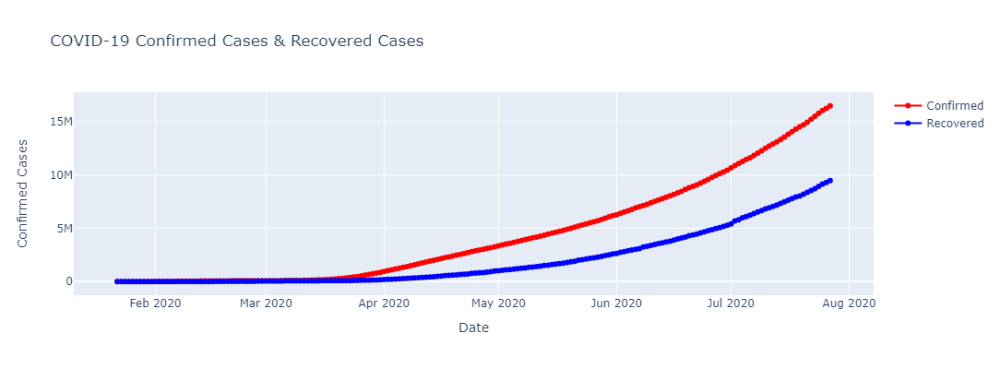

In [60]:


fig_conf_recov.add_trace(go.Scatter(x=confirmed['Date'], y=confirmed['Confirmed'], mode='lines+markers', name='Confirmed',line={'color': 'red', 'width': 2}))
fig_conf_recov.add_trace(go.Scatter(x=recoved['Date'], y=recoved['Recovered'], mode='lines+markers', name='Recovered',line={'color': 'blue', 'width': 2}))
fig_conf_recov.update_layout(
    title='COVID-19 Confirmed Cases & Recovered Cases',
    xaxis_title='Date',
    yaxis_title='Confirmed Cases',
    width=800,  
    height=400,)

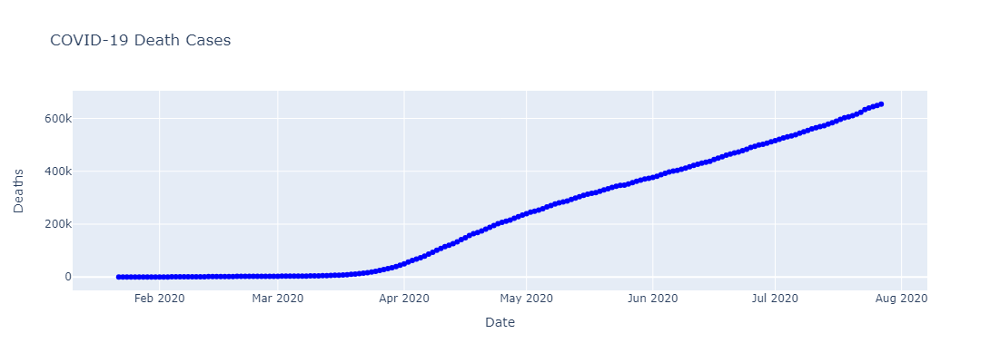

In [61]:
fig_death.add_trace(go.Scatter(x=deaths['Date'], y=deaths['Deaths'], mode='lines+markers', name='Deaths',line={'color': 'blue', 'width': 2}))
fig_death.update_layout(
    title='COVID-19 Death Cases',
    xaxis_title='Date',
    yaxis_title='Deaths',
    width=800,  
    height=400,)

In [62]:
data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


C:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.

C:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



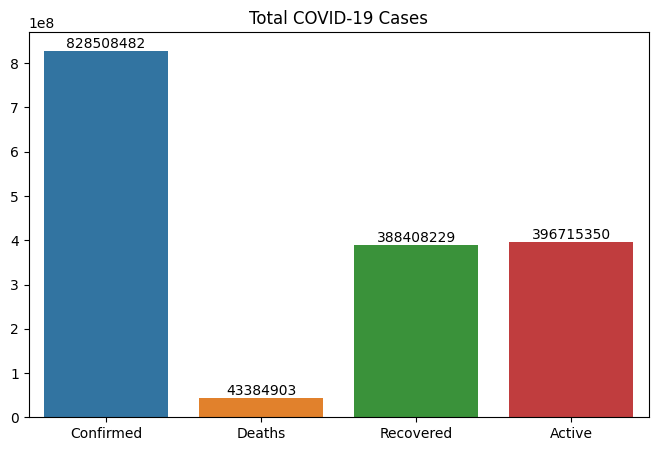

In [63]:
ctotal = data['Confirmed'].sum()
dtotal = data['Deaths'].sum()
rtotal = data['Recovered'].sum()
atotal = data['Active'].sum()

categories = ['Confirmed', 'Deaths', 'Recovered', 'Active']
values = [ctotal, dtotal, rtotal, atotal]

plt.figure(figsize=(8,5))
bars = sns.barplot(x=categories, y=values)
plt.title('Total COVID-19 Cases')

for bar, value in zip(bars.patches, values):
    plt.text(bar.get_x() + bar.get_width() / 2, value, str(value), ha='center', va='bottom', fontsize=10, color='black')

plt.show()

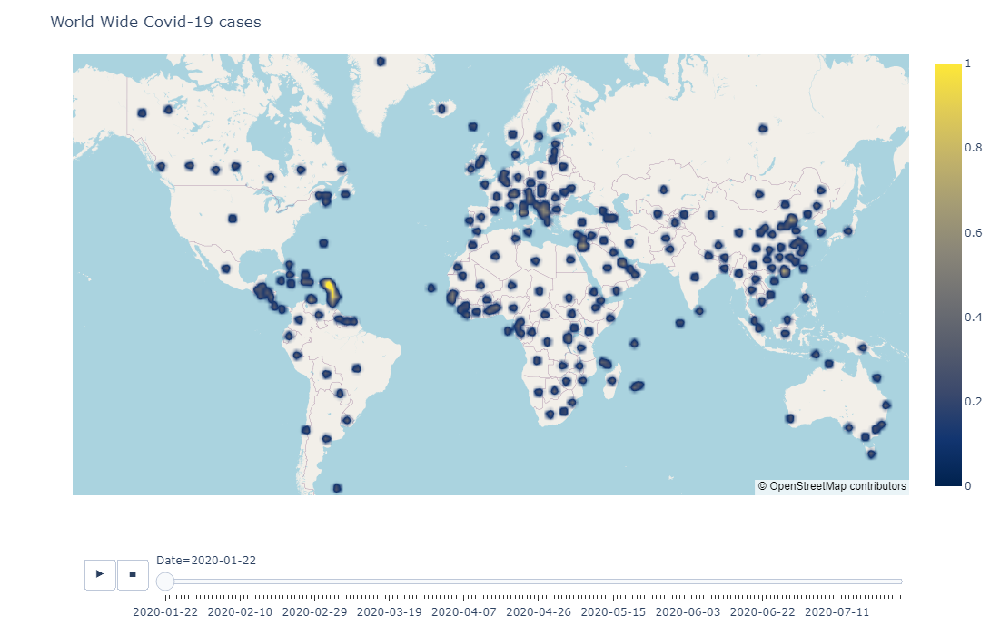

In [64]:
map=px.density_mapbox(data,lat='Lat',lon='Long',hover_name='Country/Region',
                      hover_data=['Confirmed','Recovered','Deaths'],
                      animation_frame='Date',color_continuous_scale='Cividis',
                      radius=7,zoom=1,height=700)
map.update_layout(title='World Wide Covid-19 cases')

map.update_layout(mapbox_style='open-street-map',mapbox_center_lon=0)

map.show()


In [65]:
data['Date']=pd.to_datetime(data['Date'])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  49068 non-null  object        
 1   Country/Region  49068 non-null  object        
 2   Lat             49068 non-null  float64       
 3   Long            49068 non-null  float64       
 4   Date            49068 non-null  datetime64[ns]
 5   Confirmed       49068 non-null  int64         
 6   Deaths          49068 non-null  int64         
 7   Recovered       49068 non-null  int64         
 8   Active          49068 non-null  int64         
 9   WHO Region      49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB


In [66]:
x = data.groupby(['Date'])[['Confirmed', 'Deaths', 'Active', 'Recovered']].sum().reset_index()
x

,Date,Confirmed,Deaths,Active,Recovered
0,2020-01-22,555,17,510,28
1,2020-01-23,654,18,606,30
2,2020-01-24,941,26,879,36
3,2020-01-25,1434,42,1353,39
4,2020-01-26,2118,56,2010,52
...,...,...,...,...,...
183,2020-07-23,15510481,633506,6166006,8710969
184,2020-07-24,15791645,639650,6212290,8939705
185,2020-07-25,16047190,644517,6243930,9158743
186,2020-07-26,16251796,648621,6309711,9293464


In [67]:
first_date=x[x['Date']== min(x['Date'])]
first_date

,Date,Confirmed,Deaths,Active,Recovered
0,2020-01-22,555,17,510,28


In [68]:
last_date=x[x['Date']== max(x['Date'])].reset_index()
last_date

,index,Date,Confirmed,Deaths,Active,Recovered
0,187,2020-07-27,16480485,654036,6358362,9468087


In [69]:
y = data.groupby(['Country/Region'])[['Confirmed', 'Deaths', 'Active', 'Recovered']].sum().reset_index()
y

,Country/Region,Confirmed,Deaths,Active,Recovered
0,Afghanistan,1936390,49098,1089052,798240
1,Albania,196702,5708,72117,118877
2,Algeria,1179755,77972,345886,755897
3,Andorra,94404,5423,19907,69074
4,Angola,22662,1078,15011,6573
...,...,...,...,...,...
182,West Bank and Gaza,233461,1370,170967,61124
183,Western Sahara,901,63,190,648
184,Yemen,67180,17707,25694,23779
185,Zambia,129421,2643,43167,83611


In [70]:
india = y[y['Country/Region'] == 'India']
india

,Country/Region,Confirmed,Deaths,Active,Recovered
79,India,40883464,1111831,15987913,23783720


In [71]:
sorted_confirmed = y.sort_values(by='Confirmed', ascending=False).head(10)
sorted_recovered = y.sort_values(by='Recovered', ascending=False).head(10)
sorted_deaths = y.sort_values(by='Deaths', ascending=False).head(10)
sorted_active = y.sort_values(by='Active', ascending=False).head(10)

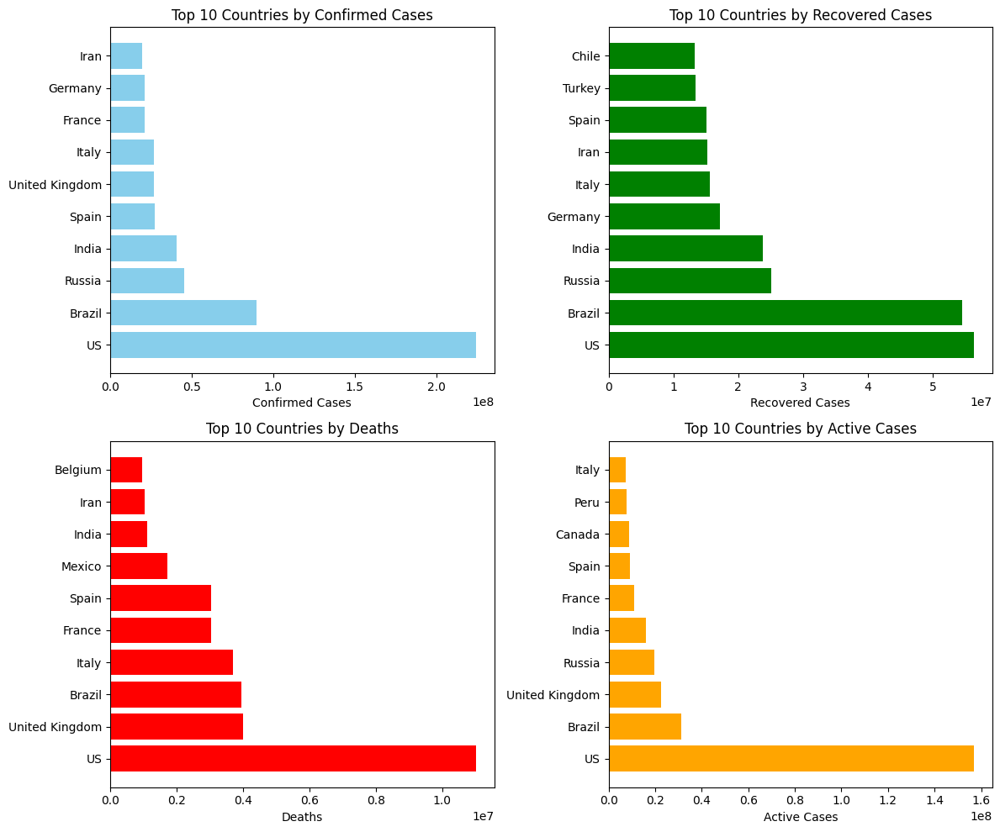

In [72]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
axes[0, 0].barh(sorted_confirmed['Country/Region'], sorted_confirmed['Confirmed'], color='skyblue')
axes[0, 0].set_xlabel('Confirmed Cases')
axes[0, 0].set_title('Top 10 Countries by Confirmed Cases')

axes[0, 1].barh(sorted_recovered['Country/Region'], sorted_recovered['Recovered'], color='green')
axes[0, 1].set_xlabel('Recovered Cases')
axes[0, 1].set_title('Top 10 Countries by Recovered Cases')

axes[1, 0].barh(sorted_deaths['Country/Region'], sorted_deaths['Deaths'], color='red')
axes[1, 0].set_xlabel('Deaths')
axes[1, 0].set_title('Top 10 Countries by Deaths')

axes[1, 1].barh(sorted_active['Country/Region'], sorted_active['Active'], color='orange')
axes[1, 1].set_xlabel('Active Cases')
axes[1, 1].set_title('Top 10 Countries by Active Cases')
plt.tight_layout()
plt.show()


In [73]:
sblue='#00FFFF'
red='#FF0000'
vmix='#00FF00'
green='#0000FF'

C:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



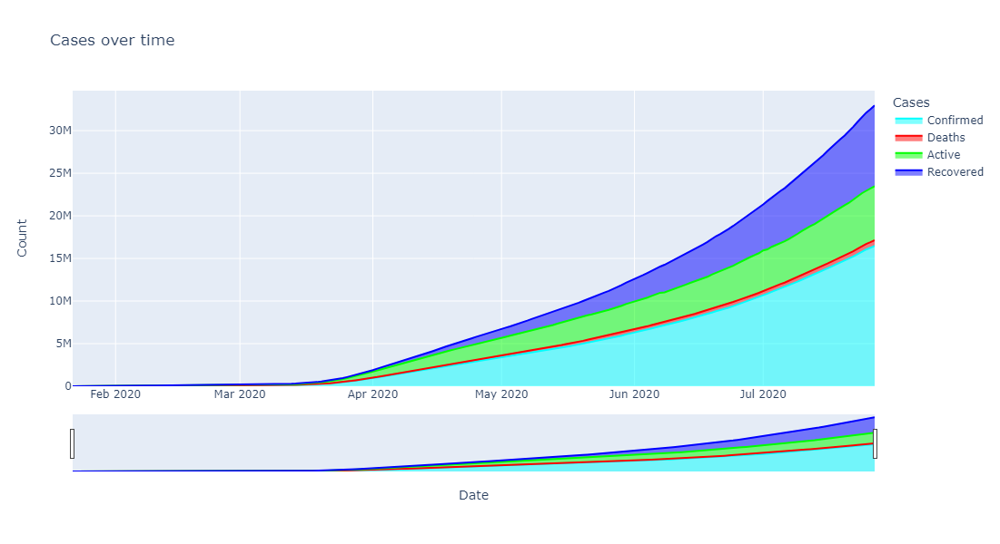

In [74]:
# area plot
mt = data.groupby([ 'Date'])[['Confirmed', 'Deaths', 'Active', 'Recovered']].sum().reset_index()
mt = mt.melt(id_vars=[ 'Date'], value_vars=['Confirmed', 'Deaths', 'Active', 'Recovered'], var_name='Cases', value_name='Count')

mt2 = px.area(mt, x='Date', y='Count', color='Cases', height=600, title='Cases over time', color_discrete_sequence=[sblue, red, vmix, green])
mt2.update_layout(xaxis_rangeslider_visible=True)

# day_wise data 

In [75]:
day_wise.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


In [76]:
day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    188 non-null    object 
 1   Confirmed               188 non-null    int64  
 2   Deaths                  188 non-null    int64  
 3   Recovered               188 non-null    int64  
 4   Active                  188 non-null    int64  
 5   New cases               188 non-null    int64  
 6   New deaths              188 non-null    int64  
 7   New recovered           188 non-null    int64  
 8   Deaths / 100 Cases      188 non-null    float64
 9   Recovered / 100 Cases   188 non-null    float64
 10  Deaths / 100 Recovered  188 non-null    float64
 11  No. of countries        188 non-null    int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 17.8+ KB


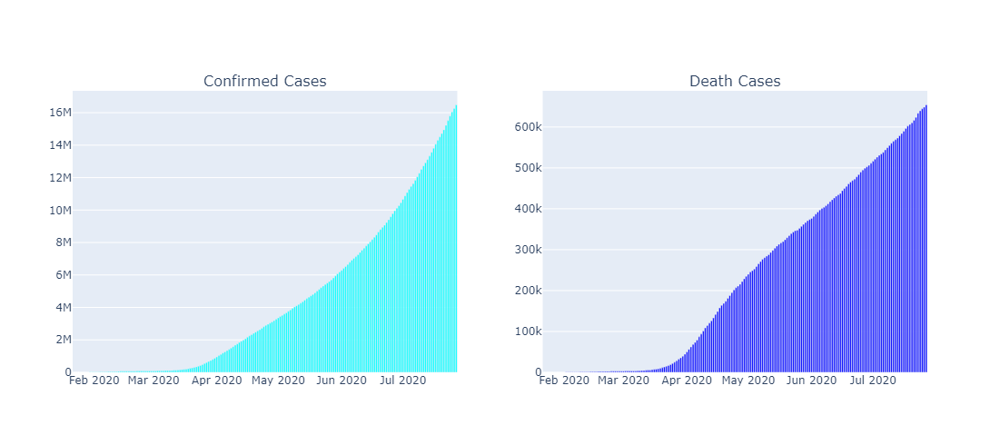

In [77]:
bar_a = px.bar(day_wise, x='Date', y='Confirmed', color_discrete_sequence=[sblue])
bar_b = px.bar(day_wise, x='Date', y='Deaths', color_discrete_sequence=[green])

plot = make_subplots(rows=1, cols=2,horizontal_spacing=0.1,
                     subplot_titles=('Confirmed Cases', 'Death Cases'))
plot.add_trace(bar_a['data'][0], row=1, col=1)
plot.add_trace(bar_b['data'][0], row=1, col=2)
plot.update_layout(height=490)
plot.show()


# Country wise data

In [78]:
country_wise.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [79]:
country_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Confirmed               187 non-null    int64  
 2   Deaths                  187 non-null    int64  
 3   Recovered               187 non-null    int64  
 4   Active                  187 non-null    int64  
 5   New cases               187 non-null    int64  
 6   New deaths              187 non-null    int64  
 7   New recovered           187 non-null    int64  
 8   Deaths / 100 Cases      187 non-null    float64
 9   Recovered / 100 Cases   187 non-null    float64
 10  Deaths / 100 Recovered  187 non-null    float64
 11  Confirmed last week     187 non-null    int64  
 12  1 week change           187 non-null    int64  
 13  1 week % increase       187 non-null    float64
 14  WHO Region              187 non-null    ob

In [80]:
top=10

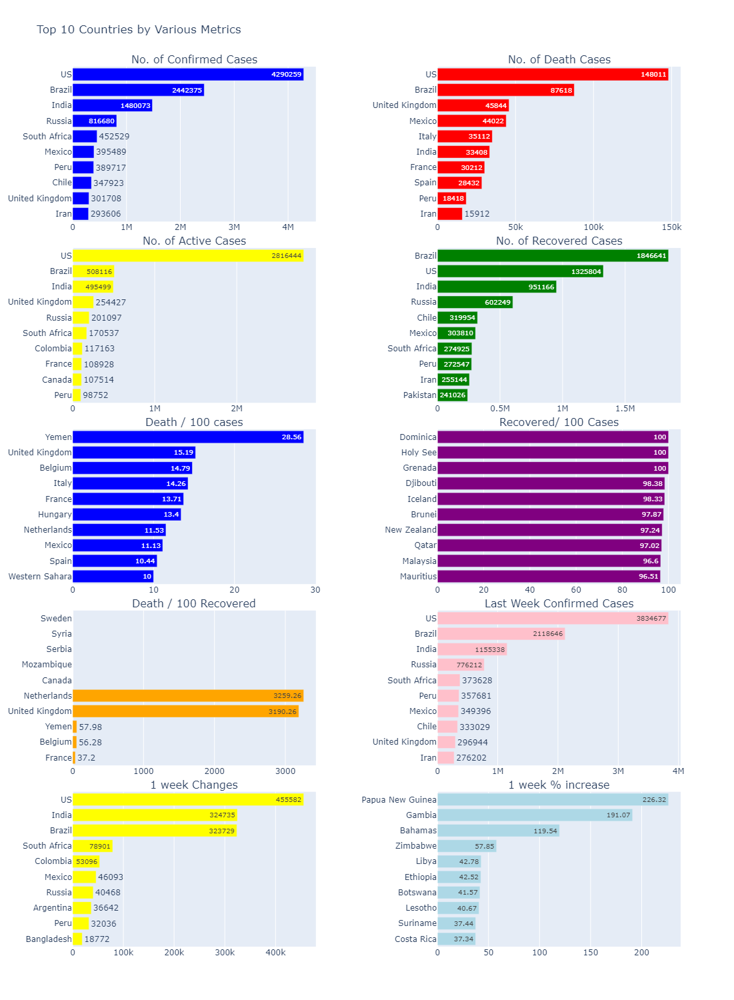

In [81]:
top = 10

chart_conf = px.bar(country_wise.sort_values('Confirmed').tail(top), x='Confirmed', y='Country/Region', text='Confirmed',
                    orientation='h', color_discrete_sequence=['blue'])

chart_death = px.bar(country_wise.sort_values('Deaths').tail(top), x='Deaths', y='Country/Region', text='Deaths',
                     orientation='h', color_discrete_sequence=['red'])

chart_act = px.bar(country_wise.sort_values('Active').tail(top), x='Active', y='Country/Region', text='Active',
                     orientation='h', color_discrete_sequence=['yellow'])

chart_rec = px.bar(country_wise.sort_values('Recovered').tail(top), x='Recovered', y='Country/Region', text='Recovered',
                   orientation='h', color_discrete_sequence=['green'])

chart_d100 = px.bar(country_wise.sort_values('Deaths / 100 Cases').tail(top), x='Deaths / 100 Cases',
                    y='Country/Region', text='Deaths / 100 Cases', orientation='h', color_discrete_sequence=['blue'])

chart_reco100 = px.bar(country_wise.sort_values('Recovered / 100 Cases').tail(top), x='Recovered / 100 Cases',
                       y='Country/Region', text='Recovered / 100 Cases', orientation='h', color_discrete_sequence=['purple'])

chart_death100_reco = px.bar(country_wise.sort_values('Deaths / 100 Recovered').tail(top),
                             x='Deaths / 100 Recovered', y='Country/Region', text='Deaths / 100 Recovered',
                             orientation='h', color_discrete_sequence=['orange'])

chart_conf_last_week = px.bar(country_wise.sort_values('Confirmed last week').tail(top), x='Confirmed last week', y='Country/Region', text='Confirmed last week',
                              orientation='h', color_discrete_sequence=['pink'])

chart_1week_change = px.bar(country_wise.sort_values('1 week change').tail(top), x='1 week change', y='Country/Region', text='1 week change',
                             orientation='h', color_discrete_sequence=['yellow'])

chart_1week_percnt_incr = px.bar(country_wise.sort_values('1 week % increase').tail(top), x='1 week % increase', y='Country/Region', text='1 week % increase',
                                       orientation='h', color_discrete_sequence=['lightblue'])

# Create a subplot with 5 rows and 2 columns
full_bars = make_subplots(rows=5, cols=2, horizontal_spacing=0.20, vertical_spacing=0.03,
                          subplot_titles=('No. of Confirmed Cases', 'No. of Death Cases', 'No. of Active Cases', 'No. of Recovered Cases',
                                          'Death / 100 cases', 'Recovered/ 100 Cases', 'Death / 100 Recovered', 'Last Week Confirmed Cases',
                                          '1 week Changes', '1 week % increase'))

# add to subplot

full_bars.add_trace(chart_conf['data'][0], row=1, col=1)
full_bars.add_trace(chart_death['data'][0], row=1, col=2)

full_bars.add_trace(chart_act['data'][0], row=2, col=1)
full_bars.add_trace(chart_rec['data'][0], row=2, col=2)

full_bars.add_trace(chart_d100['data'][0], row=3, col=1)
full_bars.add_trace(chart_reco100['data'][0], row=3, col=2)

full_bars.add_trace(chart_death100_reco['data'][0], row=4, col=1)
full_bars.add_trace(chart_conf_last_week['data'][0], row=4, col=2)

full_bars.add_trace(chart_1week_change['data'][0], row=5, col=1)
full_bars.add_trace(chart_1week_percnt_incr['data'][0], row=5, col=2)

full_bars.update_layout(height=1500, showlegend=False, title_text='Top 10 Countries by Various Metrics')

full_bars.show()